## Map the Census Tracts with the Most Arrests for unsanctioend use of public space
for this week I wanted to undestand the census tracts with the highest arrest counts and begin to uncover trends among those high arrest tracts. Do they have parks, transit stations etc.

In [3]:
# to read and wrangle data
import pandas as pd

# to create spatial data
import geopandas as gpd

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

import filtered data from last week with the arrest counts for each type of arrest and total arrests for each census tract

In [4]:
df = pd.read_csv('week10.csv',
                  dtype=
        {'FIPS':str,
        }
               )

import another csv with census tract geodata 

In [8]:
tracts = pd.read_csv('Census_Tracts_2010.csv',
                      dtype= {'GEOID10':str,
        }
               )

In [9]:
tracts['FIPS'] = tracts['GEOID10']

merge them so we have geodata and arrest counts for each fips code

In [10]:
df2=df.merge(tracts,on="FIPS")
del df2['Unnamed: 0']

i just want to look at the fips codes with the most arrests so I filtered the data to look at any census tract with over 190 arrests.

In [16]:
df3 = df2.query('arrest_count > 190')

now i make a list of the fips codes in this filtered data file. this produces a list called fips of the census tract codes for the tracts with the most arrests 

In [17]:
fips = df3['FIPS'].tolist()
fips

['06037191201',
 '06037199120',
 '06037204600',
 '06037204700',
 '06037205120',
 '06037208801',
 '06037208802',
 '06037208904',
 '06037209402',
 '06037209520',
 '06037212204',
 '06037214000',
 '06037214501',
 '06037218702',
 '06037219300']

next I upload a csv with the latitdue and long of each arrest so I can start mapping them

In [14]:
latlong = pd.read_csv('arrests_with_neighborhood_info.csv',
                      dtype= {'geoid':str,
        }
                     )

i want to filter these arrests to only map the arrests that fall into the top 20 census tracts. so i ask python to create a new latitudue longitude dataframe with just the rows that use the fips codes in the list i created above

In [14]:
latlon_filtered = latlong.loc[latlong['geoid'].isin(fips)]

now i create a base map with the census tracts and boudaries using the tracts-Copy1 and acs2021 geojsons

In [25]:
gdf_tracts = gpd.read_file('tracts-Copy1.geojson')

In [26]:
gdf_bg = gpd.read_file('acs2021_5yr_B01003_15000US060371041082.geojson')

<AxesSubplot: >

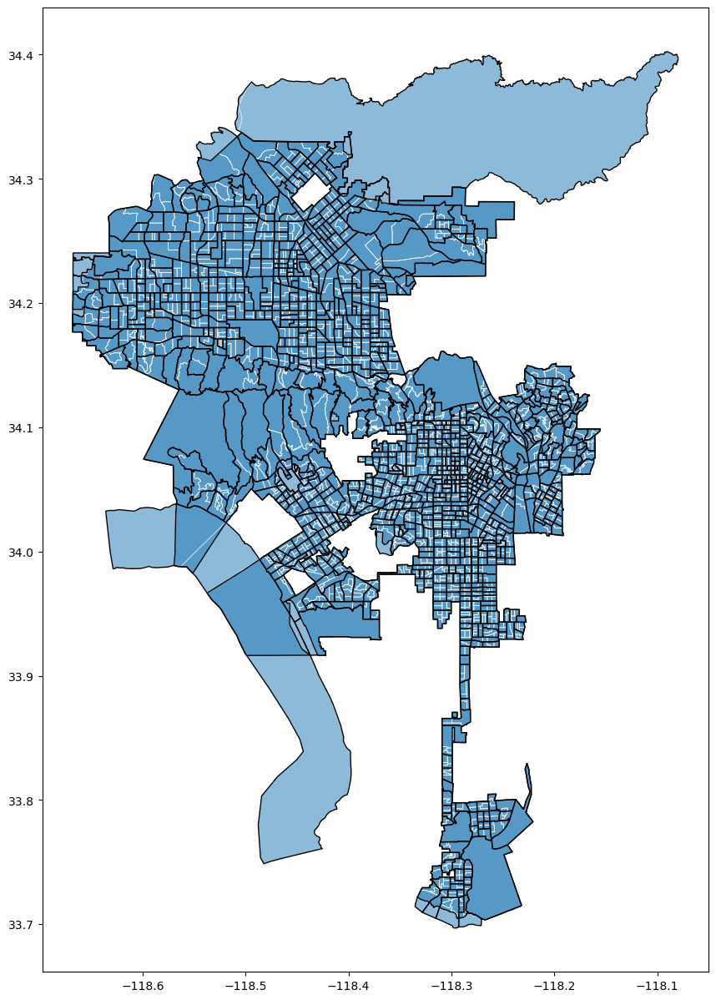

In [27]:
# compare
fig,ax = plt.subplots(figsize=(15,15))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)

# while lines to show block groups (sandwiched between the two layers above for visual clarity)
gdf_bg.boundary.plot(ax=ax,color='white',zorder=15,lw=0.5)

# black boundary lines of census tracts on top of everything
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=1)

i clean up this data to just have the columns of information I need and rename them to be more clear

In [28]:
gdf_bg = gdf_bg[['geoid','B01003001','geometry']]

gdf_bg.columns = ['FIPS','TotalPop','geometry']

drop null entries

In [29]:
gdf_bg.drop(gdf_bg.tail(1).index,inplace=True)

make sure that fips codes are consistent across dataframes

In [30]:
# fix FIPS code
gdf_bg['FIPS'] = gdf_bg['FIPS'].str.replace('15000US','')
gdf_bg.tail()

,FIPS,TotalPop,geometry
2679,060379800261,16.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2680,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2681,060379800311,1160.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2682,060379800391,0.0,"MULTIPOLYGON (((-118.36215 34.13903, -118.3612..."
2683,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


set the map projections to epsg

In [31]:
gdf_bg = gdf_bg.to_crs(epsg=3857)

appy the latlong data (the latitude and longitude of each arrest) to my base map

In [32]:
arrests = gpd.GeoDataFrame(latlong, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(latlong.lon, latlong.lat))

make sure arrests and tract boundaries are all on the same projection

In [33]:
arrests = arrests.to_crs(epsg=3857)

make sure datatypes are correct (lat and longitude have decimals and the dataframe is clean

In [34]:
arrests.lon = arrests.lon.astype('float')
arrests.lat = arrests.lat.astype('float')

In [35]:
arrests = arrests.drop(['index_left'], axis=1)

make the point map of arrests!

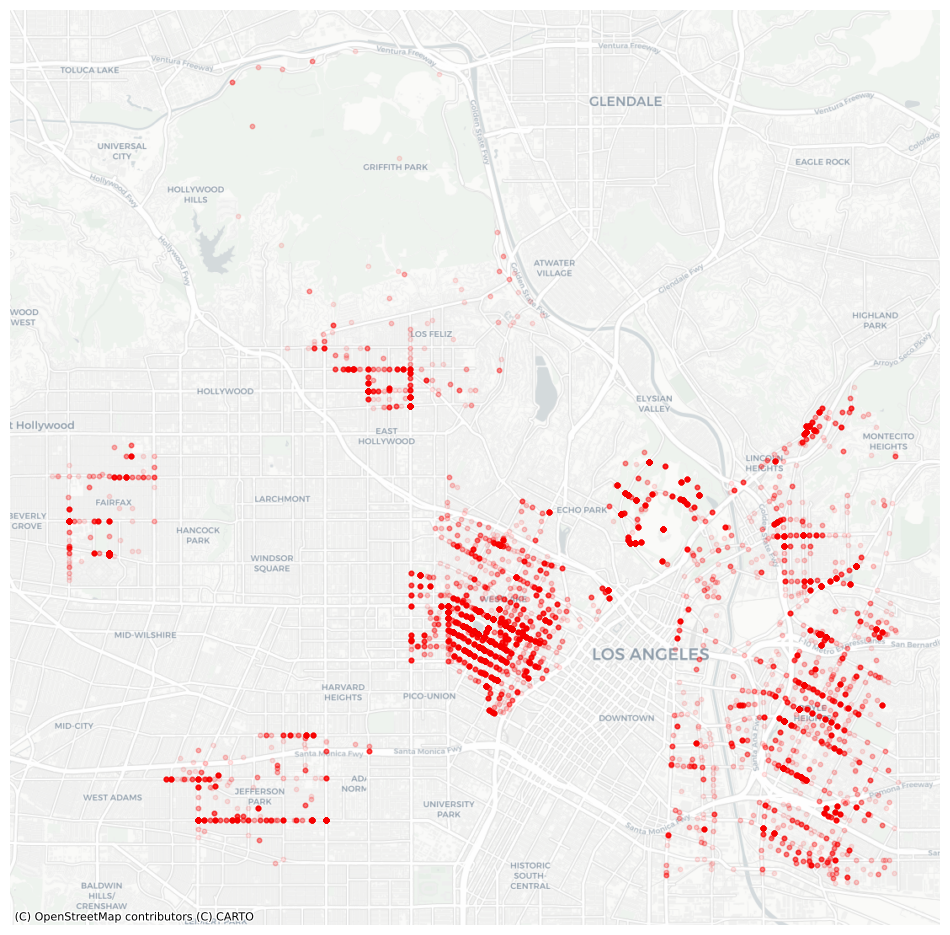

In [36]:
fig,ax = plt.subplots(figsize=(12,12))

arrests.plot(ax=ax,
             color='red',
             markersize=10, alpha=0.1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

COOOOOOL now lets make this bad boy interactive. start by getting the bounds of the map

In [37]:
minx, miny, maxx, maxy = arrests.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13176309.26384767
-13157117.783634907
4030802.9076084937
4049687.5851563863


layer the census tracts with the arrests on one map

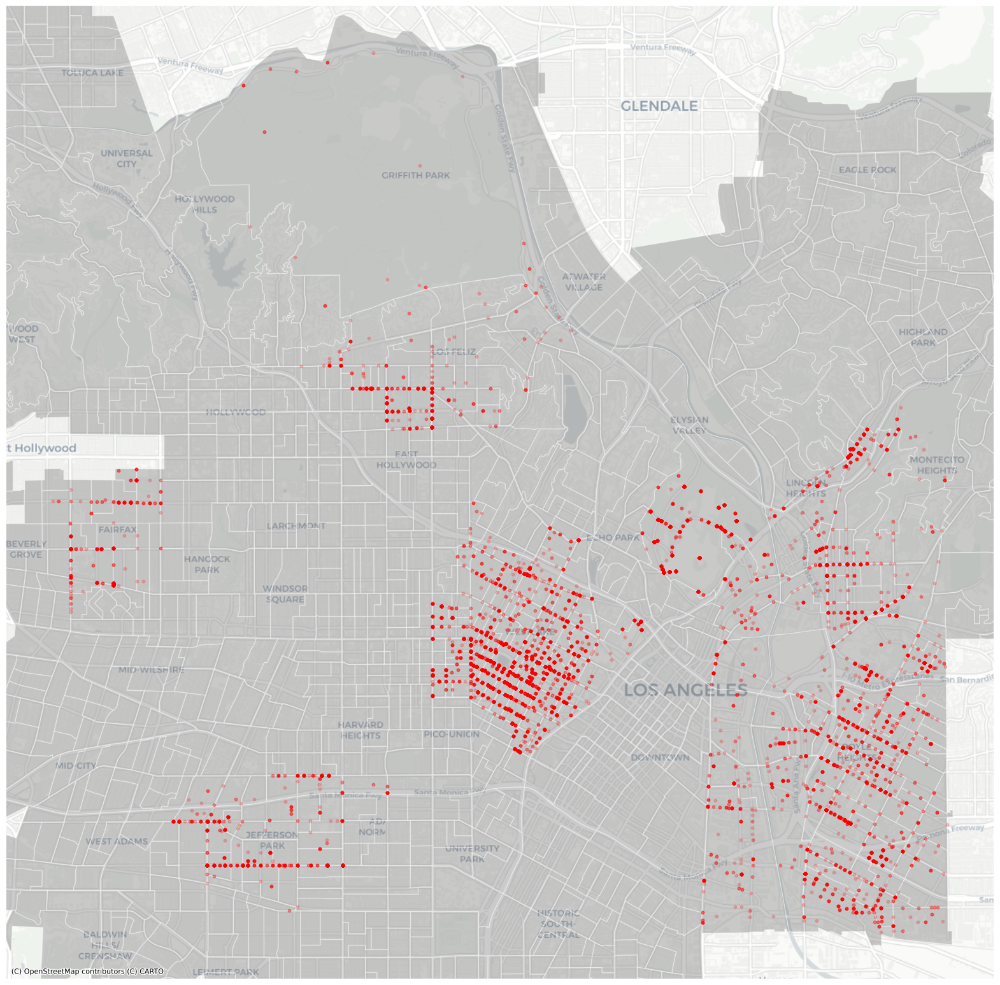

In [38]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(20, 20))

# block groups
gdf_bg.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.4)

# arrests
arrests.plot(ax=ax, # this also puts it in the same ax plot
        color='red',
        markersize=10,
        alpha=0.2)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [39]:
arrests.shape

(20988, 21)

join the arrest data with the geodata

In [40]:
join = gpd.sjoin(gdf_bg, arrests, how='left')

do the value count for total arrests in each census tract

In [41]:
arrests_by_bg = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='arrests_count')
arrests_by_bg

,FIPS,arrests_count
0,060372088011,3736
1,060379800101,1800
2,060372094022,778
3,060372088022,642
4,060372033001,526
...,...,...
2679,060371394023,1
2680,060371395021,1
2681,060371395022,1
2682,060371395041,1


create a merged file with the arrest totals for each census tract and the geodata assocaited with that tract

In [42]:
gdf_count=gdf_bg.merge(arrests_by_bg,on='FIPS')

map them! 

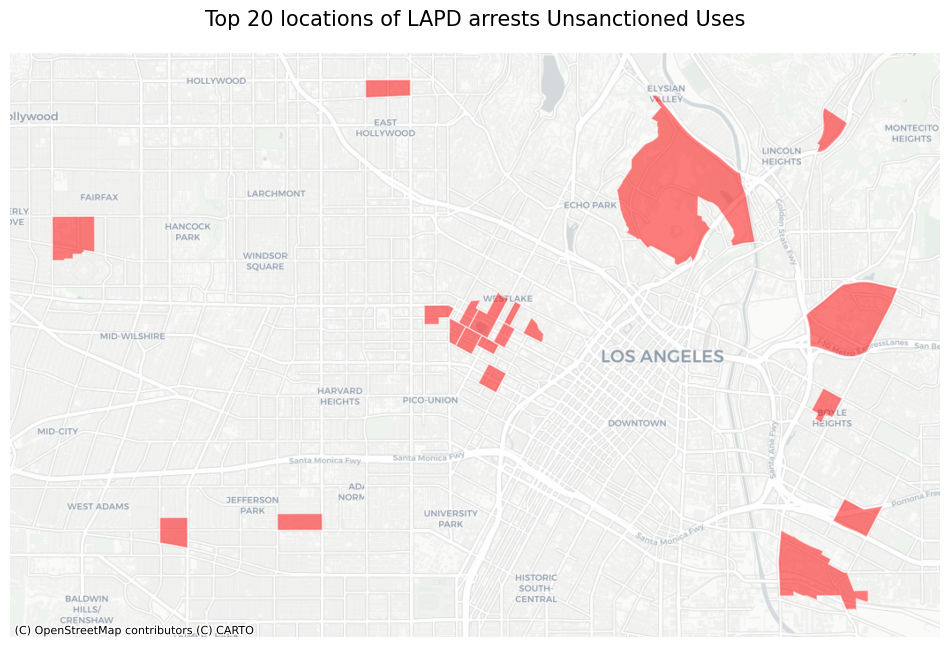

In [43]:
# map the top 20 geographies
fig,ax = plt.subplots(figsize=(12,10))
gdf_count.sort_values(by='arrests_count',ascending=False)[:20].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5)


# title
ax.set_title('Top 20 locations of LAPD arrests Unsanctioned Uses',fontsize=15,pad=20)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

now I am going to make an array to put this on an interactive map

In [44]:
arrests = gdf_count['arrests_count'] 
mask = arrests < 170
masked_arrests = np.ma.masked_array(arrests, mask)

here I am making it interactie with a color scheme but I want to save this as an html so i decided to move it into folium

In [45]:
gdf_count.explore(column=masked_arrests,
               legend=True,
               cmap='coolwarm',
               scheme='naturalbreaks',
               tiles='CartoDB positron',
               style_kwds={'weight':0.5,
                           'color':'none',
                           'opacity':2,
                           'alpha':0.5},
              vmin=170, # set the minimum value for the color scale
               vmax=masked_arrests.max())


In [46]:
gdf_filtered = gdf_count.query('arrests_count > 205')

In [47]:
import folium

i use all the same data and create a folium map of the census tracts with the most arrests for unsanctioned use of public space

In [48]:
dt = [34.049425, -118.246379]

m = folium.Map(location=dt, 
               zoom_start=12,
              tiles='CartoDB Positron')

threshold_scale = [205, 350, 550, 2000, 4000]  # boundaries between color classes
color_scale = ['none', 'yellow', 'orange', 'red', 'darkred']  # colors for each class

folium.Choropleth(
    geo_data=gdf_filtered,
    data=gdf_filtered,
    key_on='feature.properties.FIPS',
    columns=['FIPS','arrests_count'],
    fill_color='Spectral_r',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Arrests',
    smooth_factor=0,
    threshold_scale=threshold_scale,
    
).add_to(m)

m

now I am adding markers to all of the parks in or adjacent to census tracts with high arrests

In [49]:
icone1 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker1 = folium.Marker([34.073744, -118.355059], popup='Pan Pacific Park', icon=icone1)
marker1.add_to(m)

icone2 = folium.Icon(icon="tree", icon_color="white", color="lightgray", prefix="fa")
marker2 = folium.Marker([34.100167, -118.294113], popup='Barnsdall Art Park', icon=icone2)
marker2.add_to(m)

icone3 = folium.Icon(icon="tree", icon_color="white", color="lightgray", prefix="fa",)
marker3 = folium.Marker([34.062594, -118.284102], popup='Lafayette Park', icon=icone3)
marker3.add_to(m)

icone4 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker4 = folium.Marker([34.058964, -118.278089], popup='MacArthur Park', icon=icone4)
marker4.add_to(m)

icone6 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker6 = folium.Marker([34.077254, -118.239923], popup='Elysian Park, Dodgers Stadium', icon=icone6)
marker6.add_to(m)

icone7 = folium.Icon(icon="tree", icon_color="white", color="lightgray", prefix="fa",)
marker7 = folium.Marker([34.090542, -118.212280], popup='Greayers Oak Mini Park', icon=icone7)
marker7.add_to(m)

icone8 = folium.Icon(icon="tree", icon_color="white", color="lightgray", prefix="fa",)
marker8 = folium.Marker([34.092803, -118.207016], popup='Lummis Park', icon=icone8)
marker8.add_to(m)

icone9 = folium.Icon(icon="tree", icon_color="white", color="lightgray", prefix="fa",)
marker9 = folium.Marker([34.066862, -118.200778], popup='Lincoln Park', icon=icone9)
marker9.add_to(m)

icone10 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker10 = folium.Marker([34.059237, -118.201524], popup='Hazard Recreation Center', icon=icone10)
marker10.add_to(m)

icone11 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker11 = folium.Marker([34.044615, -118.211905], popup='Ross Valencia Community Park', icon=icone11)
marker11.add_to(m)

icone12 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker12 = folium.Marker([34.026856, -118.206149], popup='Ramon Garcia Recreation Center', icon=icone12)
marker12.add_to(m)

icone13 = folium.Icon(icon="tree", icon_color="white", color="darkgreen", prefix="fa",)
marker13 = folium.Marker([34.021077, -118.211124], popup='Lou Costello Jr Recreation Center', icon=icone13)
marker13.add_to(m)
m

export as html for our storymap!

In [47]:
m.save('tagmap.html')

now I want to make a similar map but instead of parks, I want to include train stations so i make another base folium map with arrest counts. 

In [50]:
dt = [34.049425, -118.246379]

p = folium.Map(location=dt, 
               zoom_start=12,
              tiles='CartoDB Positron')

threshold_scale = [205, 350, 550, 2000, 4000]  # boundaries between color classes
color_scale = ['none', 'yellow', 'orange', 'red', 'darkred']  # colors for each class

folium.Choropleth(
    geo_data=gdf_filtered,
    data=gdf_filtered,
    key_on='feature.properties.FIPS',
    columns=['FIPS','arrests_count'],
    fill_color='Spectral_r',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Arrests',
    smooth_factor=0,
    threshold_scale=threshold_scale,
    
).add_to(p)

add a csv of transit station lat and longitude

In [51]:
transit = pd.read_csv('Metro_Stations.csv')

print a list of the station names, latitude, and longitude

In [52]:
for index, row in transit.iterrows():
    print(row.Name, row.latitude, row.longitude)

Union Station 34.05605499 -118.23644042
Long Beach Transit Mall 33.768069 -118.192689
1st Street Metro Station 33.768078 -118.189832
Pacific Metro Station 33.772137 -118.193715
5th Street Metro Station 33.772348 -118.189364
Anaheim Metro Station 33.782302 -118.189359
PCH Metro Station 33.789566 -118.189361
Willow Metro Station 33.806285 -118.189487
Wardlow Metro Station 33.819397 -118.195716
Del Amo Metro Station 33.847566 -118.210822
Artesia Metro Station 33.876644 -118.222793
Compton Metro Station 33.896314 -118.224232
Imperial / Wilmington (Rosa Parks) Metro Station 33.929046 -118.23805
103rd Street Metro Station 33.942702 -118.24324
Firestone Metro Station 33.959616 -118.243261
Florence Metro Station 33.974346 -118.24331
Slauson Metro Station 33.987604 -118.243195
Vernon Metro Station 34.003194 -118.243138
Washington Metro Station 34.020406 -118.242825
San Pedro Metro Station 34.027081 -118.256067
Grand Metro Station 34.033017 -118.268996
Pico Metro Station 34.040422 -118.266455
7t

apply those stations to my map. then i used these to identify the census tracts that touch or are adjacent to transit stations.

In [53]:
for index, row in transit.iterrows():
    # add folium marker code
    folium.Circle([row.latitude, row.longitude], 
                  popup=row.Name, 
                  tooltip=row.description,
                 color = 'gray').add_to(p)
p

I created lists of all the lat and longitude points for each train line so i could apply it to my map

In [58]:
purplepoints = [ ( 34.061753 , -118.301458 ) ,
( 34.061689 , -118.308756 ) ,
( 34.062701 , -118.290082 ) ,
( 34.056368 , -118.274879 ) ,
( 34.048634 , -118.258682 ) ,
( 34.049316 , -118.251259 ) ,
( 34.0549 , -118.246057 ) ,
( 34.056197 , -118.234249 )]

In [59]:
greenpoints=[( 33.89464 , -118.369196 ) ,
( 33.905299 , -118.383113 ) ,
( 33.916063 , -118.386539 ) ,
( 33.9232 , -118.387572 ) ,
( 33.929621 , -118.377134 ) ,
( 33.933408 , -118.351602 ) ,
( 33.925201 , -118.32655 ) ,
( 33.928683 , -118.291733 ) ,
( 33.928714 , -118.2811 ) ,
( 33.927465 , -118.265217 ) ,
( 33.928258 , -118.238052 ) ,
( 33.92488 , -118.209945 ) ,
( 33.91307 , -118.1406 ) ,
( 33.914033 , -118.104717 )]

In [60]:
goldpoint = [
( 34.033398 , -118.154469 ) ,
( 34.033364 , -118.161206 ) ,
( 34.033319 , -118.16814 ) ,
( 34.0343 , -118.192182 ) ,
( 34.043747 , -118.210061 ) ,
( 34.047215 , -118.219648 ) ,
( 34.047634 , -118.22594 ) ,
( 34.0501 , -118.237901 ) ,
( 34.056061 , -118.234759 ) ,
( 34.063861 , -118.23584 ) ,
( 34.080949 , -118.220429 ) ,
( 34.087227 , -118.213213 ) ,
( 34.098243 , -118.206712 ) ,
( 34.111179 , -118.192606 ) ,
( 34.115186 , -118.157886 ) ,
( 34.133521 , -118.148126 ) ,
( 34.14191 , -118.148214 ) ,
( 34.148356 , -118.147512 ) ,
( 34.151806 , -118.13139 ) ,
( 34.152417 , -118.114348 ) ,
( 34.147752 , -118.081212 ) ,
( 34.14286 , -118.029199 ) ,
( 34.133155 , -118.003473 ) ,
( 34.132518 , -117.96768 ) ,
( 34.129048 , -117.932506 ) ,
( 34.135863 , -117.906631 ) ,
( 34.136814 , -117.891636 ) ]

In [61]:
expopoints =[( 34.040735 , -118.266118 ) ,
( 34.04861 , -118.258822 ),
( 34.029112 , -118.273603 ) ,
( 34.022123 , -118.278118 ) ,
( 34.018227 , -118.285734 ) ,
( 34.018245 , -118.29154 ) ,
( 34.018331 , -118.30891 ) ,
( 34.022526 , -118.335078 ) ,
( 34.023981 , -118.346095 ) ,
( 34.024803 , -118.355159 ) ,
( 34.026355 , -118.37212 ) ,
( 34.027896 , -118.388986 ) ,
( 34.029323 , -118.404255 ) ,
( 34.036816 , -118.424576 ) ,
( 34.035408 , -118.434234 ) ,
( 34.031705 , -118.452896 ) ,
( 34.027995 , -118.46912 ) ,
( 34.023155 , -118.480372 ) ,
( 34.01401 , -118.491384 )]

In [62]:
red_points = [
( 34.168504 , -118.376808 ) ,
( 34.140002 , -118.362699 ) ,
( 34.101547 , -118.338549 ) ,
( 34.10163 , -118.32518 ) ,
( 34.101737 , -118.308117 ) ,
( 34.097708 , -118.291756 ) ,
( 34.08991 , -118.29173 ) ,
( 34.076526 , -118.291686 ),
( 34.062701 , -118.290082 ) ,
( 34.056368 , -118.274879 ) ,
( 34.048634 , -118.258682 ) ,
( 34.049316 , -118.251259 ) ,
( 34.0549 , -118.246057 ) ,
( 34.056197 , -118.234249 )]

In [67]:
blue_points = [( 33.768071 , -118.192921 ) ,
    ( 33.76874 , -118.189362 ) ,
( 33.773598 , -118.189412 ),
( 33.772258 , -118.1937 ) ,
( 33.78183 , -118.189384 ) ,
( 33.78909 , -118.189382 ) ,
( 33.807079 , -118.189834 ) ,
( 33.819865 , -118.19609 ) ,
( 33.848222 , -118.211017 ) ,
( 33.876082 , -118.222503 ) ,
( 33.89749 , -118.224249 ) ,
( 33.928048 , -118.237555 ) ,
( 33.94222 , -118.243159 ) ,
( 33.959611 , -118.243205 ) ,
( 33.97374 , -118.243271 ) ,
( 33.98876 , -118.243398 ) ,
( 34.00292 , -118.243303 ) ,
( 34.01965 , -118.243084 ) ,
( 34.026807 , -118.255505 ) ,
( 34.033155 , -118.269333 ) ,
( 34.040735 , -118.266118 ),
( 34.04861 , -118.258822 )]

i used polylines to apply the lines to the folium map

In [71]:
folium.PolyLine(red_points,
               color="red",
               weight =4,
               opacity=.5).add_to(p)

folium.PolyLine(blue_points,
               color="blue",
               weight =4,
               opacity=.5).add_to(p)

folium.PolyLine(expopoints,
               weight =4,
               opacity=.5).add_to(p)

folium.PolyLine(goldpoint,
                color="gold",
               weight =4,
               opacity=.75).add_to(p)

folium.PolyLine(greenpoints,
                color="green",
               weight =4,
               opacity=.75).add_to(p)

folium.PolyLine(purplepoints,
                color="purple",
               weight =4,
               opacity=.75).add_to(p)

i added markers to the stations that touch hihg arrest census tracts or are very close to them

In [72]:
icone14 = folium.Icon(icon="train", icon_color="white", color="red", prefix="fa",)
marker14 = folium.Marker([34.098202, -118.291759], popup='Vermont / Sunset Metro Station', icon=icone14)
marker14.add_to(p)

icone15 = folium.Icon(icon="train", icon_color="white", color="blue", prefix="fa",)
marker15 = folium.Marker([34.02252995, -118.33483848], popup='Expo/Crenshaw Metro Station', icon=icone15)
marker15.add_to(p)

icone16 = folium.Icon(icon="train", icon_color="white", color="red", prefix="fa",)
marker16 = folium.Marker([ 34.05723, -118.276328], popup='Westlake / McArthur Park Metro Station', icon=icone16)
marker16.add_to(p)

icone17 = folium.Icon(icon="train", icon_color="white", color="red", prefix="fa",)
marker17 = folium.Marker([34.06229, -118.291005], popup='Wilshire / Vermont Metro Station', icon=icone17)
marker17.add_to(p)

icone18 = folium.Icon(icon="train", icon_color="white", color="orange", prefix="fa",)
marker18 = folium.Marker([34.087747, -118.212631], popup='Heritage Square', icon=icone18)
marker18.add_to(p)

icone19 = folium.Icon(icon="train", icon_color="white", color="orange", prefix="fa",)
marker19 = folium.Marker([ 34.043759, -118.209729], popup='Soto Metro Station', icon=icone19)
marker19.add_to(p)

p

and saved the map as an html for my storymap

In [74]:
p.save('pubmap.html')